In [1]:
import os
import pdfplumber
from pdf2image import convert_from_path
import pytesseract
import numpy as np
import cv2
import PIL


In [2]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import words
nltk.download('punkt')
nltk.download('words')


def count_english_words(text):
    # Tokenize the input text
    tokens = word_tokenize(text)

    # List of English words
    english_words = set(words.words())

    # Check which tokens are in the English dictionary
    valid_words = [word for word in tokens if word.lower() in english_words]

    return len(valid_words)

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/anthonybrew/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     /Users/anthonybrew/nltk_data...
[nltk_data]   Package words is already up-to-date!


In [2]:
import pdf_to_txt as p

In [3]:
path = "../raw/sermons archive/Sermons/Special Occasions/Crucial Events/2002-11-11-Remembrance=3bfadvent-year-a.pdf"
images = p.convert_from_path(path)

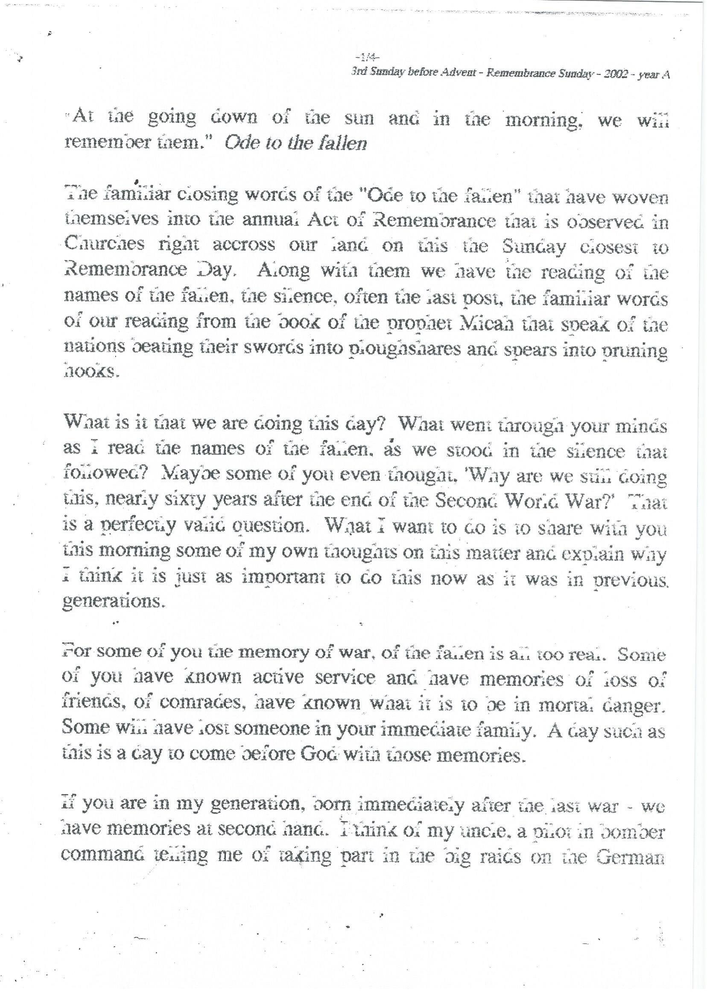

In [25]:
images[0]

In [14]:
import sys
import cv2
import numpy as np

# Load and resize image
def reconstruct(image, n=0):
    im = np.array(image)
    H, W = im.shape[:2]
    S = 4
    im = cv2.resize(im, (W*S, H*S))

    # Convert to binary
    msk = im.copy()
    msk = cv2.cvtColor(msk, cv2.COLOR_BGR2GRAY)
    msk = cv2.threshold(msk, 200, 255, cv2.THRESH_BINARY)[1]

    # Glue char blobs together
    kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 13))
    kernel2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (4, 5))
    msk = cv2.medianBlur(msk, 3)
    msk = cv2.erode(msk, kernel1)
    msk = cv2.erode(msk, kernel2)

    # Skeletonization-like operation in OpenCV
    thinned = cv2.ximgproc.thinning(~msk)

    # Make final chars
    msk = cv2.cvtColor(msk, cv2.COLOR_GRAY2BGR)
    thinned = cv2.cvtColor(thinned, cv2.COLOR_GRAY2BGR)
    thicked = cv2.erode(~thinned, np.ones((9, 15)))
    thicked = cv2.medianBlur(thicked, 11)

    ans = [cv2.resize(msk, (W, H)),cv2.resize(thicked, (W, H)),cv2.resize(~thinned, (W, H))]
    # # Save the output
    # top = np.hstack((im, ~msk))
    # btm = np.hstack((thinned, thicked))
    return ans[n]

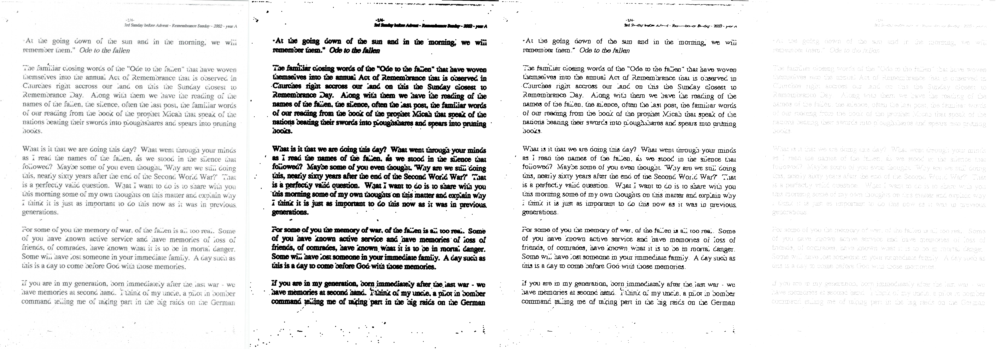

In [26]:
index = 0
raw = np.array(images[index])
ims = (raw, reconstruct(raw,0),reconstruct(raw,1),reconstruct(raw,2))
PIL.Image.fromarray(np.hstack(ims))

In [32]:

xt = lambda x : pytesseract.image_to_string(x, config="--psm 4 -l ENG")
c = lambda x : count_english_words(xt(x))
print("raw {}, mask {}, thicked {}, thin {}".format(c(ims[0]),c(ims[1]),c(ims[2]),c(ims[3])))


raw 178, mask 205, thicked 180, thin 3


pytesseract.image_to_string(reconstruct(im,1), config="--psm {} -l ENG".format(1))

In [28]:
print(xt(ims[0]))

ogi

ed Sunday before Advent - Remembrance Sunday - 2002 - year A

‘At iné going Gown of the sun ané in the morning, we will
rememoer iaem.” Ode to the fallen

at Ed Pena: ~ : z Pt cd “4, Roose: 4 *
asi CAMLGaT CsOSINg WOTGS OF tae “OGe to ine faen" ifai nave woven

inemse.ves imo tae annua: Aci of Rememorance iaai is oDserveé in
Caurcaes rgat accross our .anG on wis ihe Sunday ciosesi iw
xememorance Day. A.ong wita inem we nave te reading of ihe
names of tie fauen, tae sience, often tae asi vost, ine famiiar words
of our reaGing from ine 000K of Lae propaet Micaa taai sveax of the
nations eating teir swords into p.ougasaares anc spears into oruning
OOKS.

bers iS it Wai We are Going tais Gay? Waai went tarouga your minds

i TeaG tae names of tae fauen. as we siood in ihe silence thai
followed? Mayoe some of you even thougai, "Way are we Sti Going
LHS, Neary Sixty years after ihe enc of tae Seconc Wor.é War?’ Saat
iS a verfeciy vaiic question. Waat i want tO GO iS iO Saare Wila you
ais

In [29]:
print(xt(ims[1]))

5 8 om me em tase te + ee ome yee CONE | ETT SAO IIE NR ETRE 3

“ie .
Sud Sunday beiove Advent - Rememiuance Stenday - 2002- yaor A

ener Ce Oe tothe ten 08 58 tae ‘moming, we wit
rememoer taem.” Ode to the fallen

Tae familar ciosing words of the “Ode wo the fazen” that ave woven
taemseives into the annual Act of Rememorance taat is ooserved in
‘Caurcaes rigat accross our :anc on ttis the Sunday closest w
Rememorance Day. Aiong wita them we fave the reading of the
names of tae faiien, the si.ence, often the sast post, the famiiiar words
_ of our reacing from tae docx of tae propiet Micaa that soeak of tae
nation’s deating their swords into poughsaares anc spears into pruning ©
20048.

Waat is it taat we are Going tais Gay? , What went tarouga your minds
as I read the names of the faiien. as we stood in te sitence that
foiiowec? Maybe some of you even thougiat, ‘Way are we stil: Going
tais, neariy sixty years after the end of the Seconé Worse War?’ Taat
is a perfectiy vaiic question. W